In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tpqoa
import sys

In [15]:
# Load OANDA config file
api = tpqoa.tpqoa('oanda.cfg')

# Getting data
df = api.get_history("EUR_USD", "2005-01-02", "2024-04-15", "M15", "M")
df.to_csv('./data/EUR_USD_M15_2005_2024_M.csv', encoding='utf-8')
# df = api.get_history("EUR_USD", "2022-01-01", "2024-04-15", "M15", "M")
# df.to_csv('./data/EUR_USD_M15_2022_2024_M.csv', encoding='utf-8')

KeyboardInterrupt: 

In [ ]:
# Import data to use in Prophet
data = pd.read_csv('./data/EUR_USD_M15_2005_2024_M.csv', 
                   parse_dates = ['time'], index_col = 'time', 
                   usecols = ['time', 'c'])
# data = pd.read_csv('./data/EUR_USD_M15_2022_2024_M.csv', 
#                    parse_dates = ['time'], index_col = 'time', 
#                    usecols = ['time', 'c'])
symbol = 'EUR_USD'
data['ds'] = data.index
data['y'] = data['c']
data.tail()
# print(data)
# data['y'] = data['c']
# len(data)

,c,ds,y
time,,,
2024-04-14 22:45:00,1.06499,2024-04-14 22:45:00,1.06499
2024-04-14 23:00:00,1.06444,2024-04-14 23:00:00,1.06444
2024-04-14 23:15:00,1.06470,2024-04-14 23:15:00,1.06470
2024-04-14 23:30:00,1.06494,2024-04-14 23:30:00,1.06494
2024-04-14 23:45:00,1.06462,2024-04-14 23:45:00,1.06462


In [ ]:
# Calculate log returns
# data['returns'] = np.log(data[symbol] / data[symbol].shift())

In [ ]:
from prophet import Prophet
import copy
def prophet_signal(df, l, backcandles, frontpredictions, diff_limit, signal):
    dfsplit = copy.deepcopy(df[l-backcandles:l+1])
    model = Prophet()
    model.fit(dfsplit)
    future = model.make_future_dataframe(periods=frontpredictions, freq='15T', include_history=False)
    forecast = model.predict(future)
    # if signal:
    forecast["y_target"] = df['y'].iloc[l+1:l+frontpredictions+1]
    forecast = forecast[['yhat', 'yhat_lower', 'yhat_upper']].values[0]
    return forecast[0], forecast[1], forecast[2]

In [ ]:
prophet_signal(data, 200, 100, frontpredictions=1, diff_limit=0.008, signal=False)

02:15:53 - cmdstanpy - INFO - Chain [1] start processing
02:15:53 - cmdstanpy - INFO - Chain [1] done processing


(1.327108146794386, 1.3257447471650716, 1.3284603772579358)

In [ ]:
from tqdm import tqdm
backcandles = 100
frontpredictions = 1
yhatlow = [0 for i in range(len(data))]
yhat = [0 for i in range(len(data))]
yhathigh = [0 for i in range(len(data))]

for row in tqdm(range(backcandles, len(data)-frontpredictions)):
    prophet_pred = prophet_signal(data, row, backcandles, frontpredictions=1, diff_limit=0.008, signal=False)
    yhatlow[row] = prophet_pred[0]
    yhat[row] = prophet_pred[1]
    yhathigh[row] = prophet_pred[2]

df['yhat'] = yhatlow
df['yhatlow'] = yhat
df['yhathigh'] = yhathigh

  0%|          | 0/56712 [00:00<?, ?it/s]02:23:54 - cmdstanpy - INFO - Chain [1] start processing
02:23:54 - cmdstanpy - INFO - Chain [1] done processing
  0%|          | 1/56712 [00:00<2:08:18,  7.37it/s]02:23:54 - cmdstanpy - INFO - Chain [1] start processing
02:23:54 - cmdstanpy - INFO - Chain [1] done processing
  0%|          | 2/56712 [00:00<1:54:38,  8.24it/s]02:23:54 - cmdstanpy - INFO - Chain [1] start processing
02:23:55 - cmdstanpy - INFO - Chain [1] done processing
  0%|          | 3/56712 [00:00<2:21:21,  6.69it/s]02:23:55 - cmdstanpy - INFO - Chain [1] start processing
02:23:55 - cmdstanpy - INFO - Chain [1] done processing
  0%|          | 4/56712 [00:00<3:00:26,  5.24it/s]02:23:55 - cmdstanpy - INFO - Chain [1] start processing
02:23:55 - cmdstanpy - INFO - Chain [1] done processing
  0%|          | 5/56712 [00:00<3:09:16,  4.99it/s]02:23:55 - cmdstanpy - INFO - Chain [1] start processing
02:23:55 - cmdstanpy - INFO - Chain [1] done processing
  0%|          | 6/56712 [

ValueError: Length of values (485949) does not match length of index (56813)

In [ ]:
df['yhatlow'] = df['yhatlow'].shift(+1)
df['yhathigh'] = df['yhathigh'].shift(+1)
df['yhat'] = df['yhat'].shift(+1)

In [ ]:
from matplotlib import pyplot as plt
x1 = 200
x2 = 250
plt.figure(figsize=(18,6))
plt.plot(data['ds'].iloc[x1:x2],data['yhatlow'].iloc[x1:x2], label="Prediction", marker='o')
plt.fill_between(data['ds'].iloc[x1:x2], data['yhat'].iloc[x1:x2], data['yhathigh'].iloc[x1:x2], color='b', alpha=.1)
plt.plot(data['ds'].iloc[x1:x2], data['y'].iloc[x1:x2], label = "Market", marker='o')
plt.legend(loc="upper left")


/home/vuphamas/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.
20:23:23 - cmdstanpy - INFO - Chain [1] start processing
20:24:46 - cmdstanpy - INFO - Chain [1] done processing
/home/vuphamas/.local/lib/python3.10/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/home/vuphamas/.local/lib/python3.10/site-packages/prophet/plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python dateti

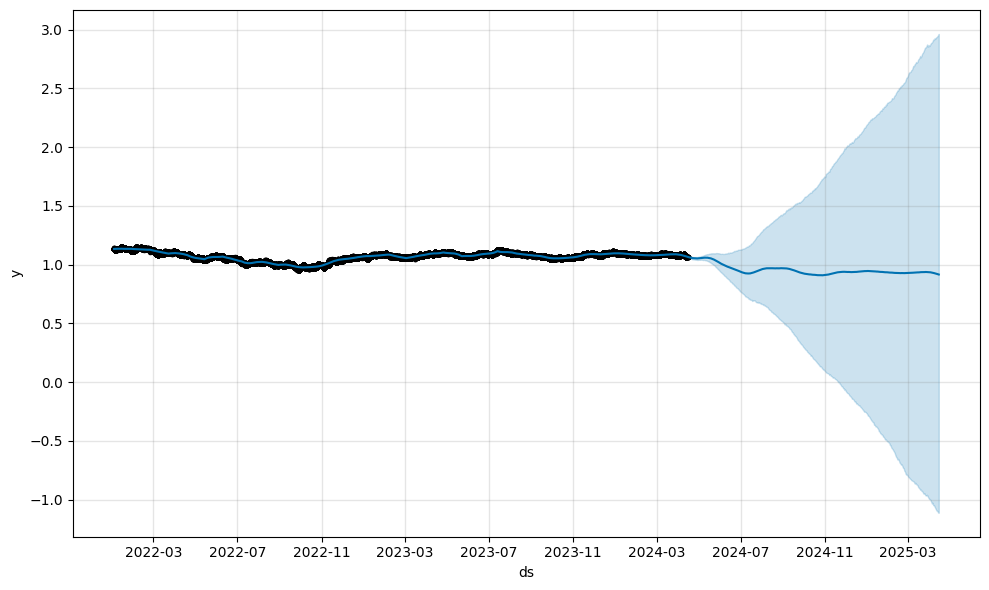

TypeError: object of type 'ellipsis' has no len()

In [ ]:
from prophet import Prophet
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your historical data into a DataFrame
# Ensure it has columns 'ds' for date and 'y' for price
# data = pd.read_csv('your_data.csv')

# Instantiate Prophet model
model = Prophet()

# Fit the model to your data
model.fit(data)

# Make future predictions
future = model.make_future_dataframe(periods=365)  # Adjust the number of periods as needed
forecast = model.predict(future)

# Plot the forecast
fig = model.plot(forecast)
plt.show()

# Evaluate the model
from sklearn.metrics import mean_squared_error

# Assuming you have actual prices for the test period
# Compare the forecasted prices against the actual prices
# Calculate RMSE as a measure of accuracy
actual_prices = ...  # Your actual prices
forecast_prices = forecast['yhat'].tail(len(actual_prices))
rmse = np.sqrt(mean_squared_error(actual_prices, forecast_prices))
print('Root Mean Squared Error:', rmse)
